In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
gaussians = np.load('/lustre/aoc/projects/hera/wchin/VaryRmax&EFF_gaussians2.npy')
radii = np.arange(9, 1 ,-1)
BOX_LEN=301
HII_DIM=301
R_BUBBLE_MAXES = np.linspace(30, 0.225, 9)
HII_EFF_FACTORS = np.array(
    [19.04625, 
     19.511249999999997, 
     20.23875, 
     21.085, 
     22.655000000000012, 
     25.779375, 
     32.056640625, 
     56.6734375, 
     5291.5]
)
total_neutral_fractions = np.array([0.2]*len(R_BUBBLE_MAXES))
redshifts = np.array([6]*len(R_BUBBLE_MAXES))
iterations = int(1e5)

## Check if object is iterable

In [4]:
def iterable(obj):
    
    try:
        iter(obj)
        
    except Exception:
        return False
    
    else:
        return True

## Histogram Function

In [3]:
def histogram(
    y1s, 
    figure_shape, 
    y2s=None,
    y3s=None,
    marker_lines=None,
    y1s_labels=None,
    y2s_label=None,
    y3s_label=None,
    title=None, 
    legend_font_size=12,
    fancy_legend_box=True,
    legend_alpha=0.5,
    shared_title=None,
    shared_title_x_position=0.5,   # figure coordinates, max=1 I think
    shared_title_y_position=0.92,
    shared_x_label=None, 
    shared_x_label_x_position=0.5,
    shared_x_label_y_position=0.08,
    shared_y_label=None, 
    shared_y_label_x_position=0.07,
    shared_y_label_y_postion=0.5,
    x_start=0, 
    x_stop=1, 
    bin_num=int(1e3), 
    color='white', 
    figure_size=(18,7), 
    font_size=15, 
    horizontal_gap=0.05, 
    vertical_gap=0.05, 
    y_scale='linear', 
    y_notation='plain', 
    share_x_axis=True, 
    share_y_axis=True,
    dpi=100
):  # a: x start, b: x stop
    
    bin_edges = np.linspace(x_start, x_stop, bin_num) # bin_num of bins from 0-1
    
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
    
    if np.array(y1s).ndim > 2:  # hopefully more robust condition.
        
        fig, axes = plt.subplots(
            figure_shape[0], 
            figure_shape[1], 
            figsize=figure_size, 
            sharex=share_x_axis, 
            sharey=share_y_axis, 
            gridspec_kw={"hspace":vertical_gap, 'wspace':horizontal_gap},
            dpi=dpi
        )
        
        if shared_title != None:
            
            fig.suptitle(
                x=shared_title_x_position, 
                y=shared_title_y_position, 
                t=shared_title, ha='center', 
                size=1.5*font_size, 
                color=color
            )
            
        if shared_x_label != None:  # shared x label
            fig.text(
                x=shared_x_label_x_position, 
                y=shared_x_label_y_position, 
                s=shared_x_label, ha='center', 
                size=font_size, 
                color=color
            )

        if shared_y_label != None:  # shared y label
            fig.text(
                x=shared_y_label_x_position, 
                y=shared_y_label_y_postion, 
                s=shared_y_label, 
                va='center', 
                rotation='vertical', 
                size=font_size, 
                color=color
            )
        
        for i, y1 in enumerate(y1s):
            
            for ii, marker_line in enumerate(marker_lines):
                axes.flatten()[i].plot(
                    bin_centers, 
                    np.histogram(y1s[i,ii,:], bins=bin_edges)[0], 
                    marker_line,
                    label=y1s_labels[ii]
                )
            
            if iterable(y2s):
                axes.flatten()[i].plot(
                    bin_centers, 
                    np.histogram(y2s[i], bins=bin_edges)[0], 
                    '--', 
                    label=y2s_label
                )
                
                if iterable(y3s):
                    axes.flatten()[i].plot(
                        bin_centers, 
                        np.histogram(y3s[i], bins=bin_edges)[0], 
                        label=y3s_label
                    )
                    
                    
            if y1s_labels != None:
                axes.flatten()[i].legend(
                    prop={'size': legend_font_size}, 
                    fancybox=fancy_legend_box, 
                    framealpha=legend_alpha
                )
                
            if title != None:
                axes.flatten()[i].set_title(title[i], color=color, fontsize=font_size)
                
            axes.flatten()[i].set_yscale(y_scale)
            
            if y_notation == 'sci':
                axes.flatten()[i].ticklabel_format(
                    axis='y', 
                    style=y_notation, 
                    scilimits=(0,0), 
                    useMathText=True
                )
                
            axes.flatten()[i].tick_params(
                color=color, 
                labelcolor=color, 
                labelsize=font_size,
                which='both'
            )  # font style

            for spine in axes.flatten()[i].spines.values():  # figure color
                spine.set_edgecolor(color)
                
    else:
        
        fig, ax = plt.subplots(figsize=figure_size)
        
        ax.plot(bin_centers, np.histogram(y1s, bins=bin_edges)[0], label=y1s_labels)
        
        if y2s != None:
            ax.plot(bin_centers, np.histogram(y2s, bins=bin_edges)[0], '--', label=y2s_label)
            
            if y3s == None:
                ax.legend(
                    prop={'size': legend_font_size}, 
                    fancybox=fancy_legend_box, 
                    framealpha=legend_alpha
                )                 
                
            else:
                ax.plot(bin_centers, np.histogram(y3s, bins=bin_edges)[0], '-.', label=y3s_label)
                ax.legend(
                    prop={'size': legend_font_size}, 
                    fancybox=fancy_legend_box, 
                    framealpha=legend_alpha
                )                 
                
        if title != None:
            ax.set_title(title, color=color, fontsize=font_size)
            
        ax.set_yscale(y_scale)
        
        if y_notation == 'sci':
            ax.ticklabel_format(axis='y', style=y_notation, scilimits=(0,0), useMathText=True)
            
        ax.tick_params(color=color, labelcolor=color, labelsize=font_size, which='both')  # font style

        for spine in ax.spines.values():  # figure color
            spine.set_edgecolor(color)
            
    plt.show()

## Creating Histogram

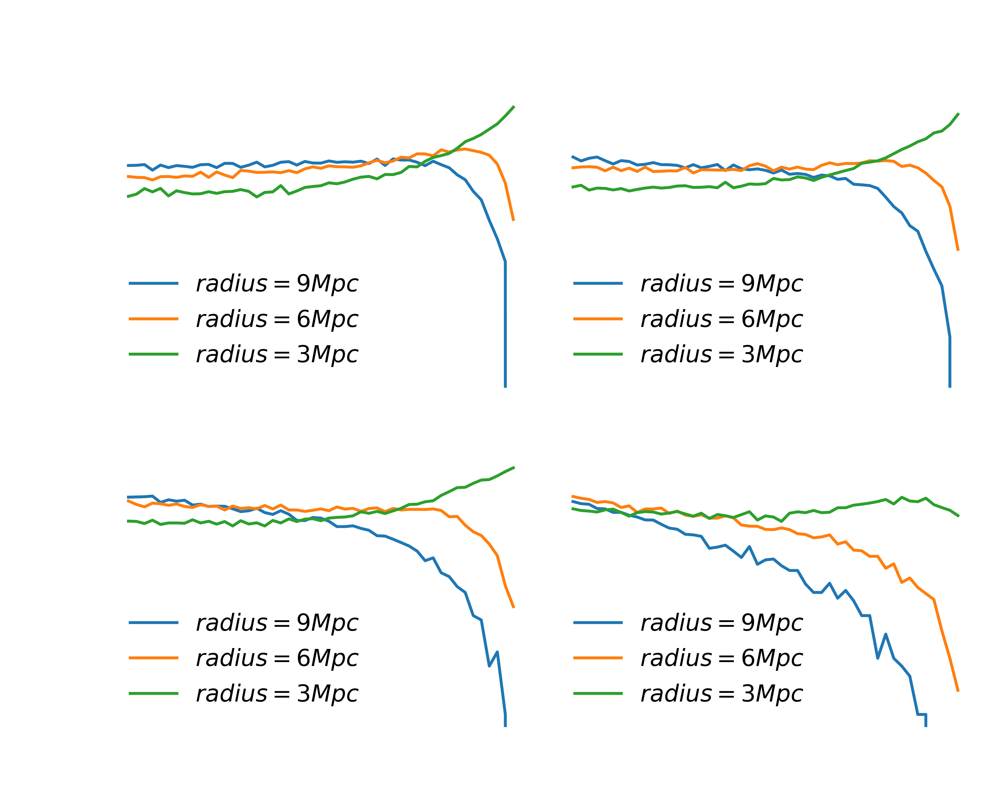

In [6]:
bins = int(5e1)
histogram(
    y1s=gaussians[[0, 5, 6, 7], ::3],       
    marker_lines=['-']*len(radii[::3]),
    y1s_labels=[f'$radius={r*BOX_LEN/HII_DIM:.0f}Mpc$' for r in radii[::3]],
    shared_title_y_position=0.975,
    shared_x_label_y_position=0.05,
    shared_y_label_x_position=0.04,
    legend_alpha=0,
    bin_num=bins, 
    x_start=0.5,
    title=[f'$Rmax={Rmax:.2f}, EFF={HII_EFF_FACTORS[[0, 5, 6, 7]][i]:.2f}$' for i,
           Rmax in enumerate(R_BUBBLE_MAXES[[0, 5, 6, 7]])],
    shared_title=f'Distributions for $z={redshifts[0]},$' r'$\langle x_{{HI}} \rangle$' f'$={total_neutral_fractions[0]}$',
    shared_y_label='Sphere Counts',
    shared_x_label=f'Neutral Fraction, $x_{{HI}}$',
    figure_shape=(2,2), 
    figure_size=(8,6),
    vertical_gap=0.15,
    horizontal_gap=0.05,
    y_scale='log',
#     y_notation='sci',
    share_y_axis=True,
    dpi=500,
    color='w'
)

In [33]:
bins = int(5e1)
histogram(
    y1s=gaussians,       
    marker_lines=['-']*len(radii),
    y1s_labels=[f'Radius={r*BOX_LEN/HII_DIM:.0f}Mpc' for r in radii],
    legend_alpha=0,
    bin_num=bins,  
    x_start=0.,
    title=[f'Rmax={Rmax:.2f}, EFF={HII_EFF_FACTORS[i]:.2f}' for i,
           Rmax in enumerate(R_BUBBLE_MAXES)],
    shared_title=f'Distribution of Average Neutral Fraction \
({bins} bins, {iterations:.2e} iterations)',
    shared_y_label='Counts',
    shared_x_label='Neutral Fraction',
    figure_shape=(3,3), 
    figure_size=(18,18),
    vertical_gap=0.1,
    horizontal_gap=0.05,
    y_scale='log',
#     y_notation='sci',
    share_y_axis=True,
    dpi=500
)

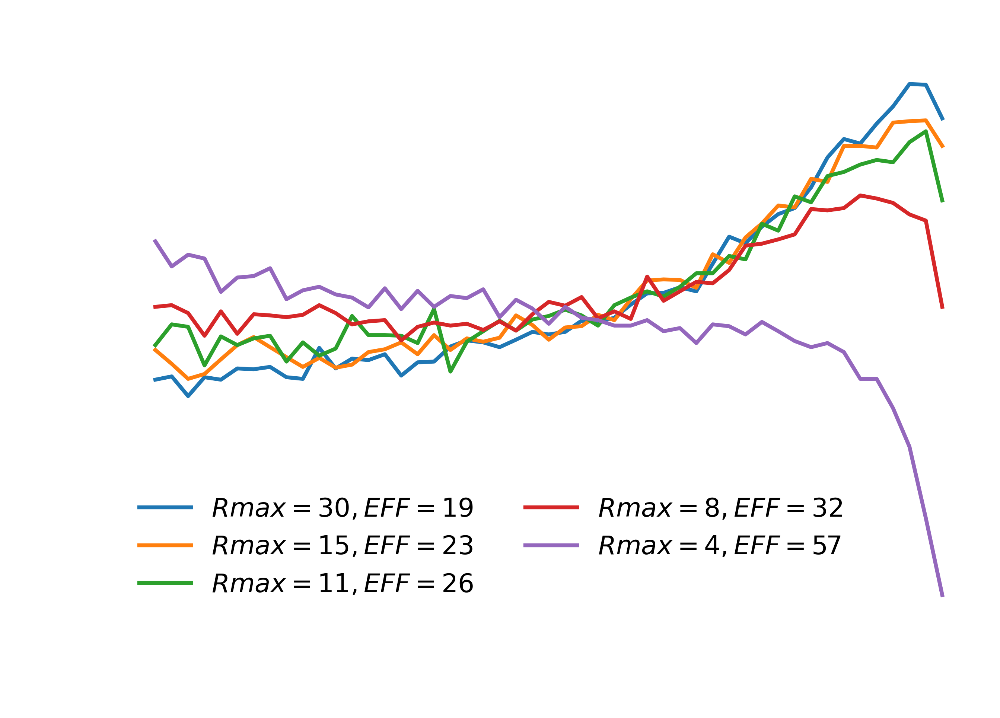

In [8]:
import matplotlib as mpl
radius = 5
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0.5, 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for i in np.array([0, 4, 5, 6, 7]):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius], bins=bin_edges)[0],
        label=f'$Rmax={R_BUBBLE_MAXES[i]:.0f}, EFF={HII_EFF_FACTORS[i]:.0f}$'
    )
plt.legend(ncol=2, fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Radius, r={radii[radius]} Mpc, z={redshifts[0]},$' r'$\langle x_{{HI}} \rangle$' f'$={total_neutral_fractions[0]}$', color=color)
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.show()

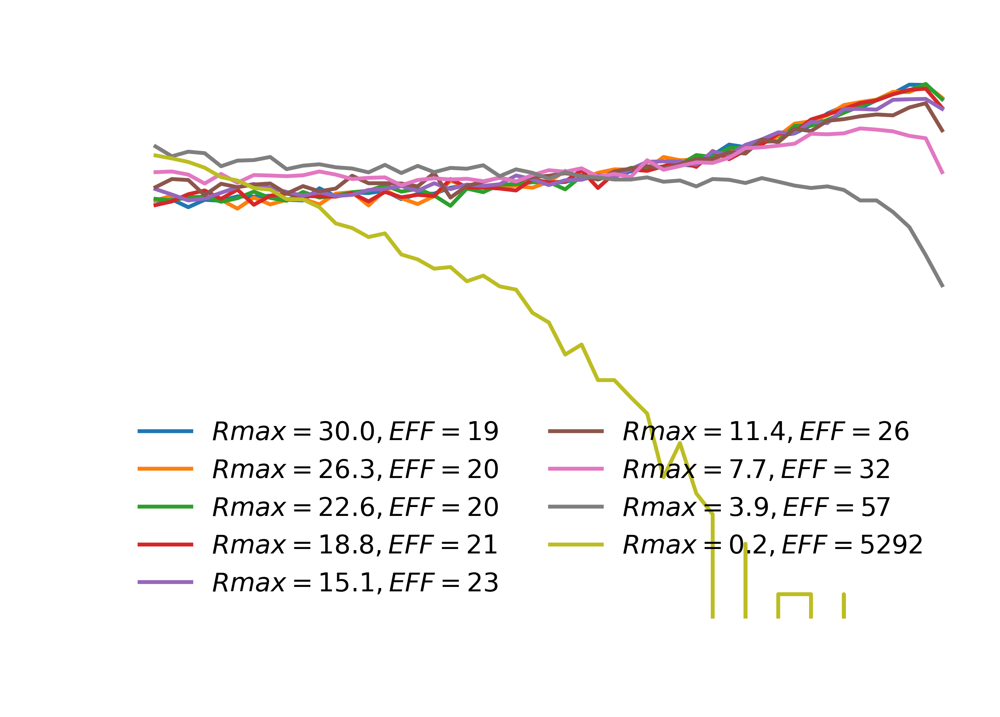

In [9]:
import matplotlib as mpl
radius = 5
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0.5, 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for i in range(9):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius], bins=bin_edges)[0],
        label=f'$Rmax={R_BUBBLE_MAXES[i]:.1f}, EFF={HII_EFF_FACTORS[i]:.0f}$'
    )
plt.legend(ncol=2, fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Radius, r={radii[radius]} Mpc$', color=color)
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.show()

In [10]:
np.shape(gaussians)

(9, 8, 100000)

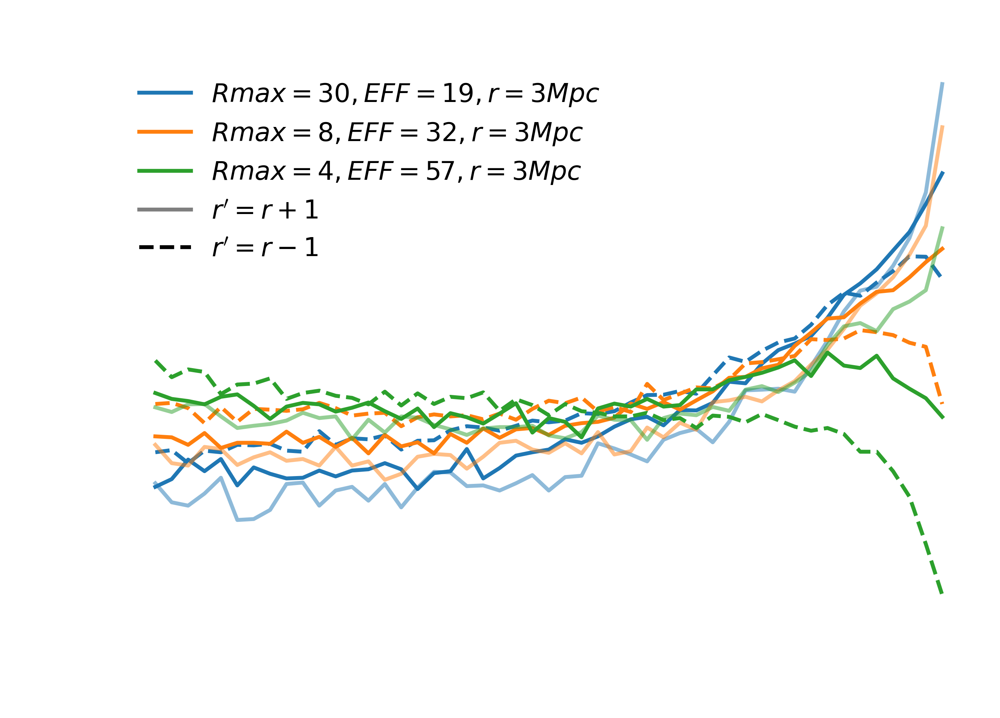

In [11]:
radius = np.array([6]*9)
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0.5, 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for j, i in enumerate(np.array([0, 6, 7])):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius[i]], bins=bin_edges)[0],
        f'C{j}',
        label=f'$Rmax={R_BUBBLE_MAXES[i]:.0f}, EFF={HII_EFF_FACTORS[i]:.0f}, r={radii[radius[i]]}Mpc$'
    )
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius[i]+1], bins=bin_edges)[0],
        alpha=0.5
    )
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius[i]-1], bins=bin_edges)[0],
        f'C{j}--',

    )
plt.semilogy([], [], 'k', alpha=0.5, label=f"$r'=r+1$")
plt.semilogy([], [], 'k--', label=f"$r'=r-1$")
plt.legend(ncol=1, fancybox=True, framealpha=0.0)
# plt.title(f'Radius = {radii[radius]} Mpc', color=color)
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.title(f'Distribution for Various Radii, $r, z={redshifts[0]},$' r'$\langle x_{{HI}} \rangle$' f'$={total_neutral_fractions[0]}$', color=color)
plt.show()

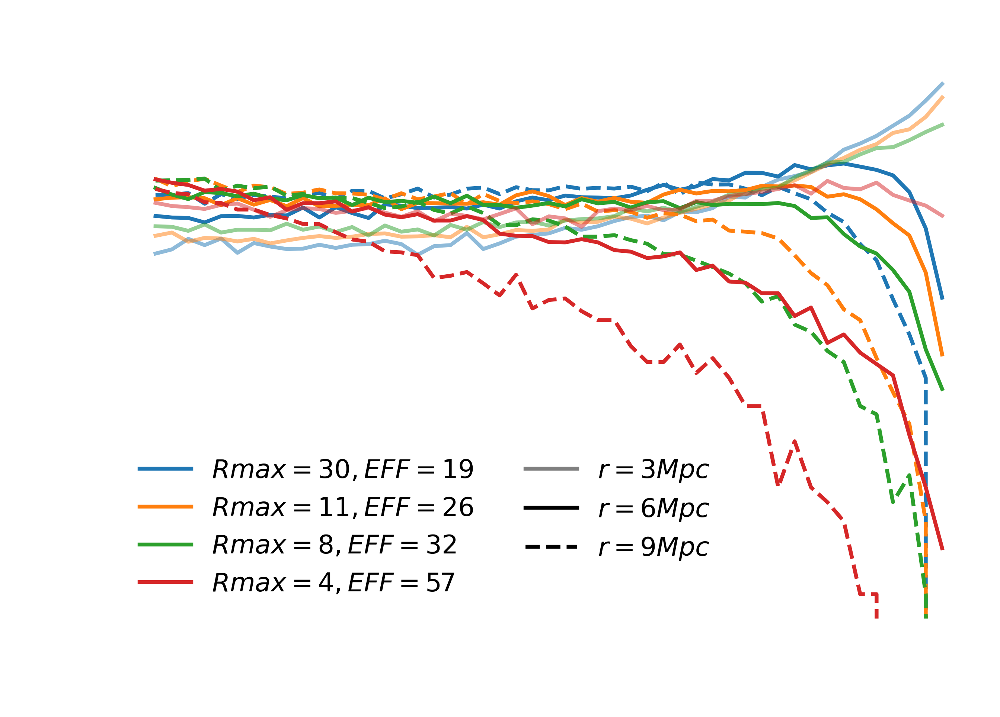

In [12]:
radius = 3
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0.5, 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for j, i in enumerate(np.array([0, 5, 6, 7])):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius], bins=bin_edges)[0],
        f'C{j}',
        label=f'$Rmax={R_BUBBLE_MAXES[i]:.0f}, EFF={HII_EFF_FACTORS[i]:.0f}$'
    )
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius+3], bins=bin_edges)[0],
        alpha=0.5
    )
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[i, radius-3], bins=bin_edges)[0],
        f'C{j}--',

    )
plt.semilogy([], [], 'k', alpha=0.5, label=f'$r={radii[radius+3]}Mpc$')
plt.semilogy([], [], 'k', label=f'$r={radii[radius]}Mpc$')
plt.semilogy([], [], 'k--', label=f'$r={radii[radius-3]}Mpc$')
plt.legend(ncol=2, fancybox=True, framealpha=0.0)
# plt.title(f'Radius = {radii[radius]} Mpc', color=color)
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.title(f'Distribution for Various Radii, $r, z={redshifts[0]},$' r'$\langle x_{{HI}} \rangle$' f'$={total_neutral_fractions[0]}$', color=color)
plt.show()

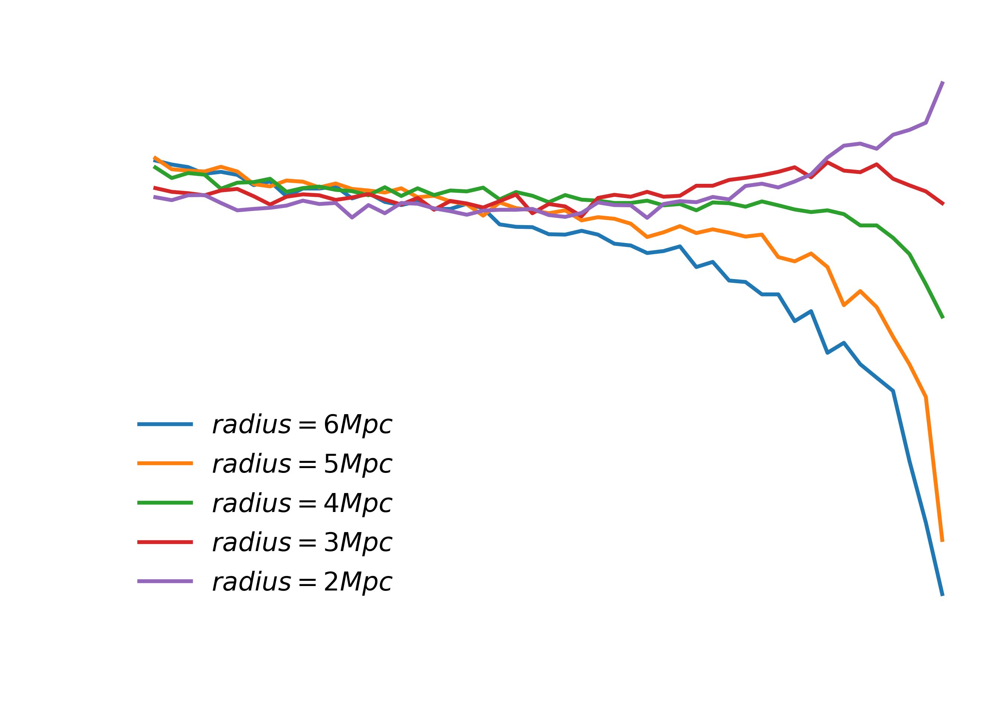

In [13]:
Rmax = 7
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0.5, 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for i in range(3,8):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
        label=f'$radius={radii[i]}Mpc$'
    )
plt.legend(fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Rmax={R_BUBBLE_MAXES[Rmax]:.2f}, EFF={HII_EFF_FACTORS[Rmax]:.2f}$', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.show()

In [14]:
np.shape(gaussians)

(9, 8, 100000)

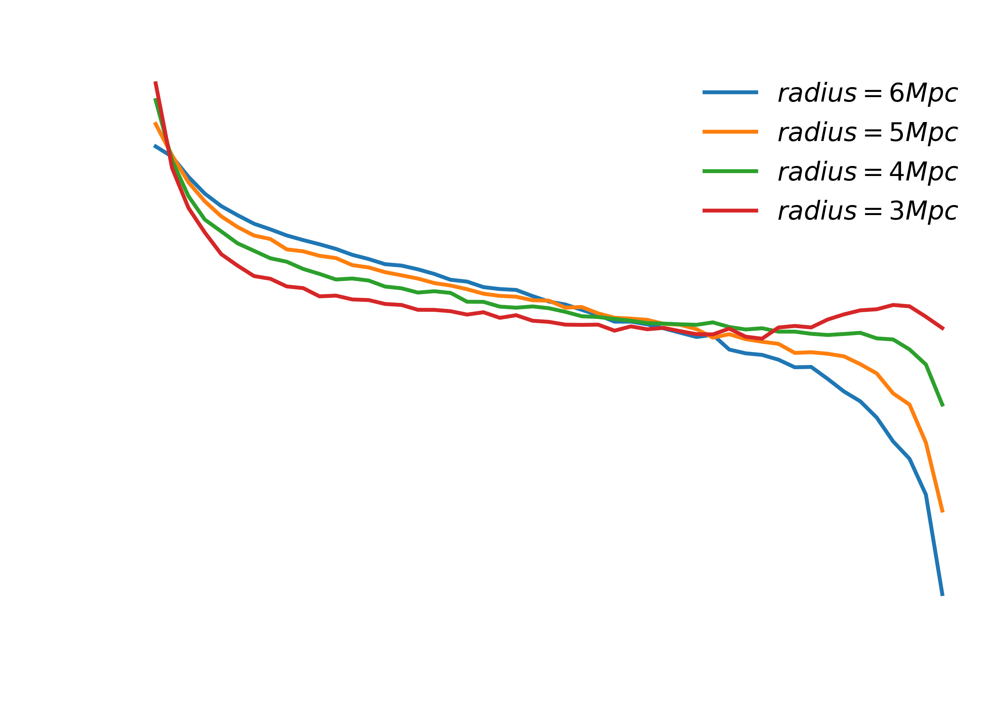

In [32]:
Rmax = 7
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0., 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for i in range(3, 7):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
        label=f'$radius={radii[i]}Mpc$'
    )
plt.legend(fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Rmax={R_BUBBLE_MAXES[Rmax]:.2f}, EFF={HII_EFF_FACTORS[Rmax]:.2f}$', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.show()

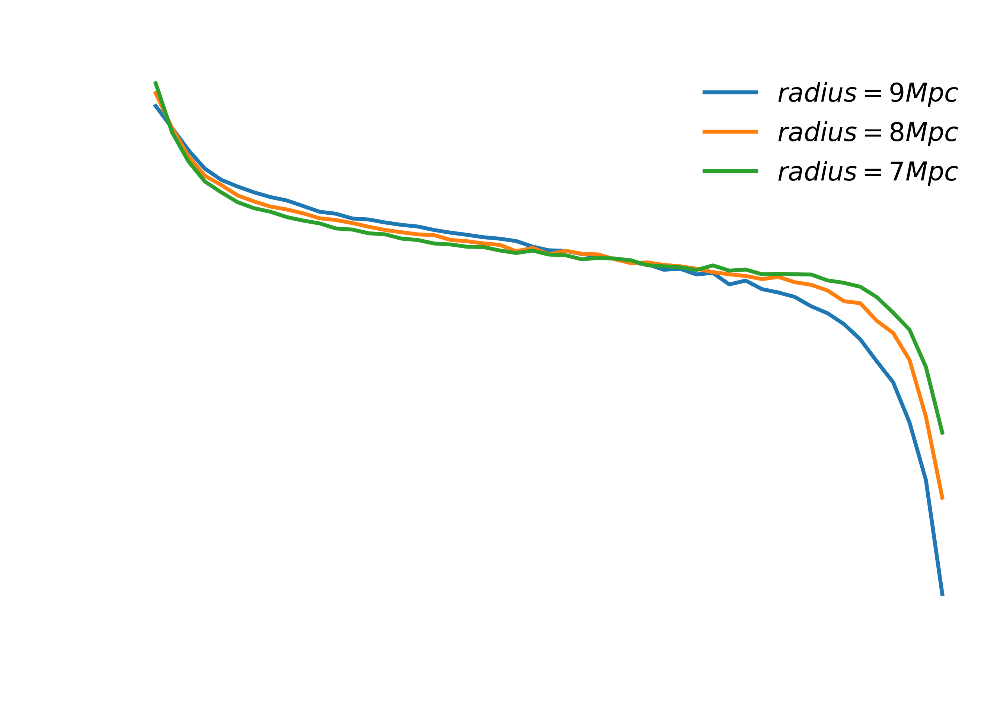

In [30]:
Rmax = -3
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0., 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for i in range(3):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
        label=f'$radius={radii[i]}Mpc$'
    )
plt.legend(fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Rmax={R_BUBBLE_MAXES[Rmax]:.2f}, EFF={HII_EFF_FACTORS[Rmax]:.2f}$', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.show()

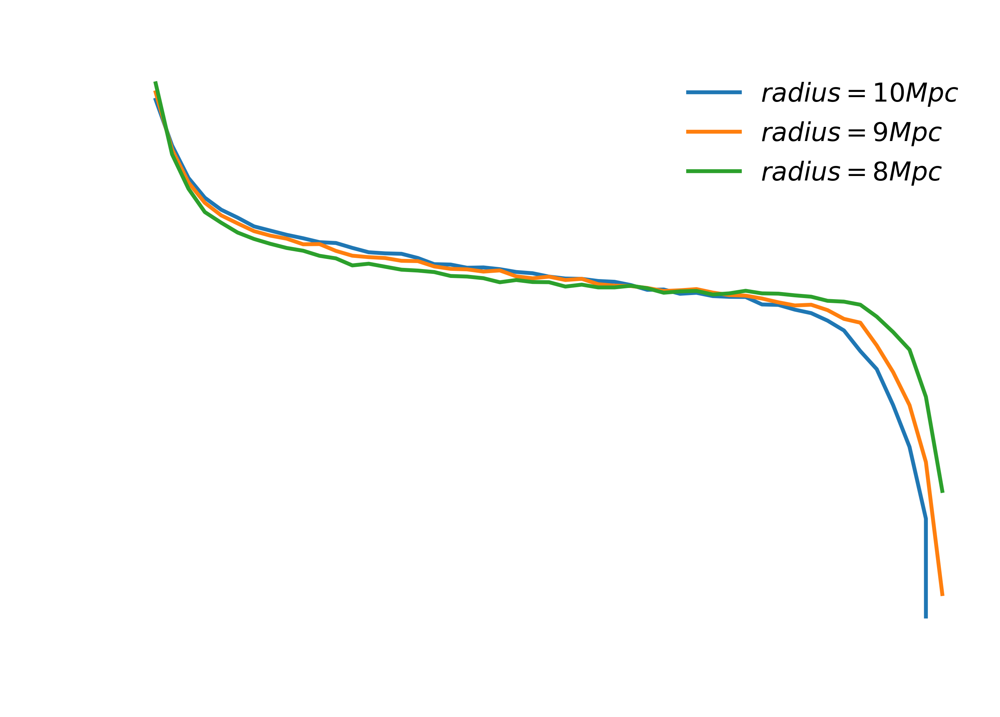

In [37]:
gaussians_Rmax11p39_r10 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax11.39_r10.npy')

Rmax = -4
color = 'w'

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0., 1., 50) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

plt.semilogy(
    bin_centers, 
    np.histogram(gaussians_Rmax11p39_r10[0, 0], bins=bin_edges)[0],
    label=f'$radius=10Mpc$'
)

for i in range(2):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
        label=f'$radius={radii[i]}Mpc$'
    )
plt.legend(fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Rmax={R_BUBBLE_MAXES[Rmax]:.2f}, EFF={HII_EFF_FACTORS[Rmax]:.2f}$', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.show()

(1, 4, 100000)

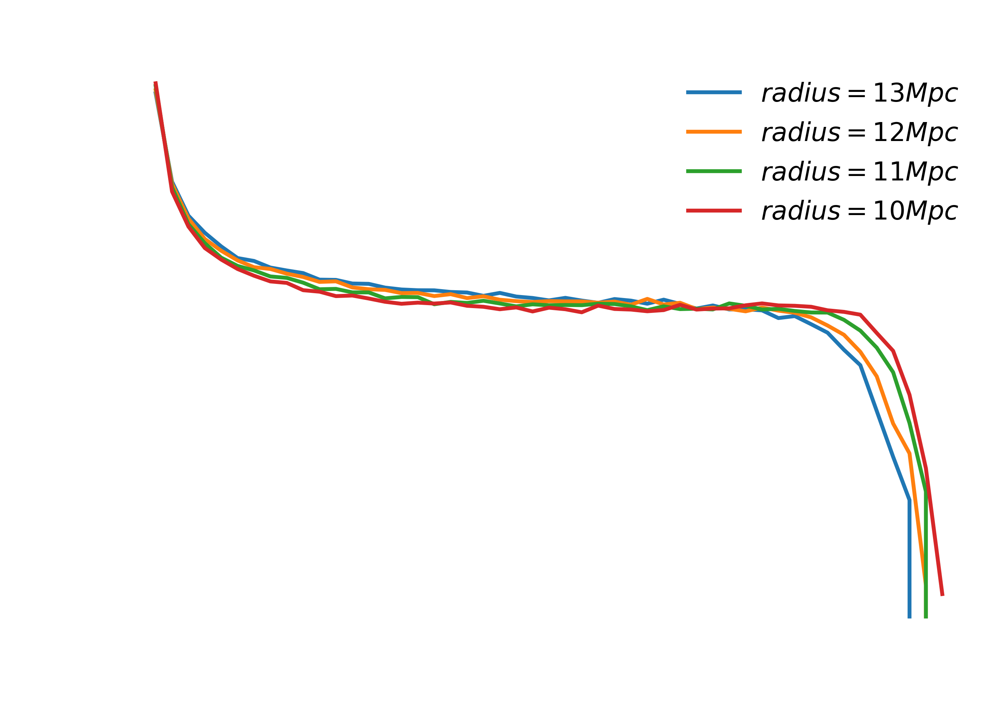

In [49]:
gaussians2 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax30_r13,12,11,10.npy')
color = 'w'
Rmax = 0

fig = plt.figure(dpi=500)
ax = fig.gca()
for spine in ax.spines.values():  # figure color
    spine.set_edgecolor(color)
bin_edges = np.linspace(0., 1., ) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

for i in range(4):
    plt.semilogy(
        bin_centers, 
        np.histogram(gaussians2[Rmax, i], bins=bin_edges)[0],
        label=f'$radius={np.arange(13, 9, -1)[i]}Mpc$'
    )
plt.legend(fancybox=True, framealpha=0.0)
plt.title(f'Distribution for $Rmax={R_BUBBLE_MAXES[Rmax]:.2f}, EFF={HII_EFF_FACTORS[Rmax]:.2f}$', color=color)
plt.tick_params(color=color, labelcolor=color, which='both')
plt.xlabel(f'Neutral Fraction, $x_{{HI}}$', color=color)
plt.ylabel('Sphere Counts', color=color)
plt.show()

In [4]:
gaussians_Rmax30_11p39_7p67_r3 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax30,11.39,7.67_r3.npy')
np.shape(gaussians_Rmax30_11p39_7p67_r3)

(3, 3, 100000)

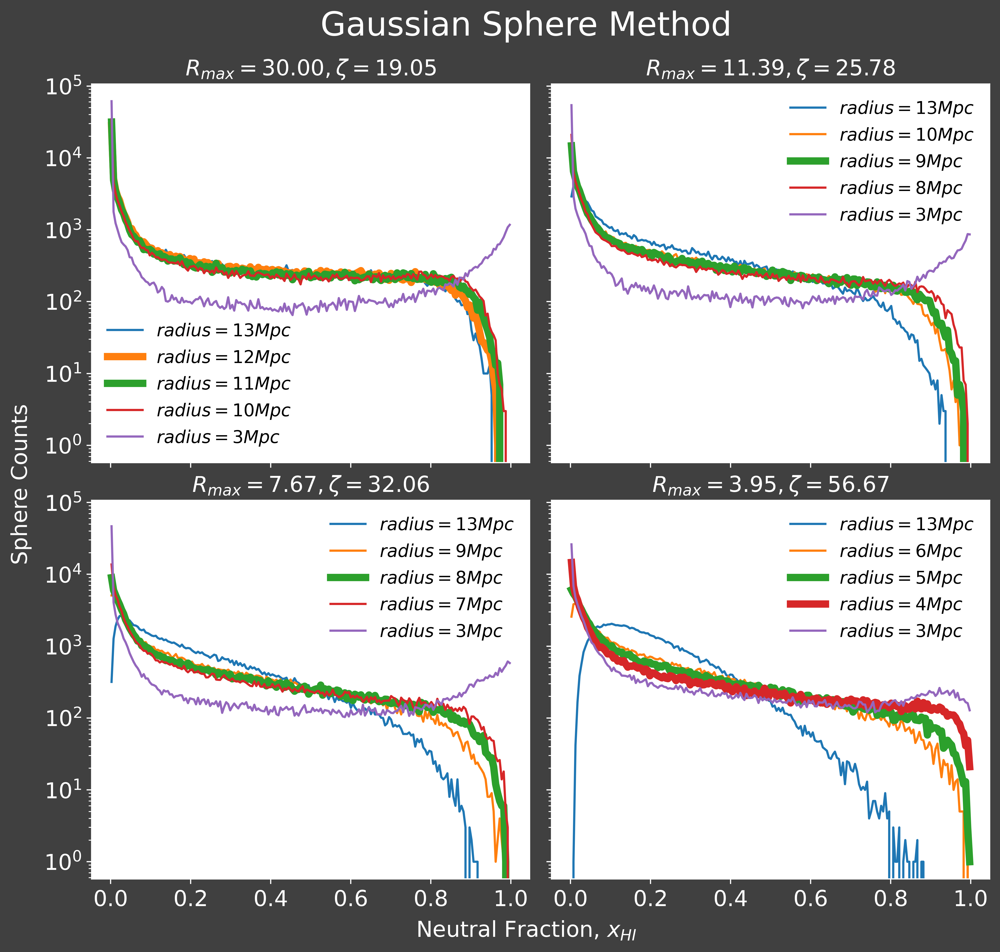

In [4]:
font_size = 15
color = 'w'

bin_edges = np.linspace(0., 1., 200) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

fig, axes = plt.subplots(
    2, 
    2, 
    figsize=(11, 10), 
    sharex=True, 
    sharey=True, 
    gridspec_kw={"hspace":0.1, 'wspace':0.05},
    dpi=500,
    facecolor='#404040'
)

fig.suptitle(
    x=0.5, 
    y=0.95, 
    t='Gaussian Sphere Method', 
    ha='center', 
    size=1.5*font_size, 
    color=color
)

# shared x label
fig.text(
    x=0.5, 
    y=0.07, 
    s=f'Neutral Fraction, $x_{{HI}}$', 
    ha='center', 
    size=font_size, 
    color=color
)

# shared y label
fig.text(
    x=0.055, 
    y=0.5, 
    s='Sphere Counts', 
    va='center', 
    rotation='vertical', 
    size=font_size, 
    color=color
)

# Rmax = 30
#============================================================================================================#
gaussians2 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax30_r13,12,11,10.npy')
gaussians_Rmax30_11p39_7p67_r3 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax30,11.39,7.67_r3.npy')
Rmax = 0

for i in range(4):
    if i == 1 or i == 2:
        axes.flatten()[0].plot(
            bin_centers, 
            np.histogram(gaussians2[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={np.arange(13, 9, -1)[i]}Mpc$',
            linewidth=5
        )
    else:
        axes.flatten()[0].plot(
            bin_centers, 
            np.histogram(gaussians2[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={np.arange(13, 9, -1)[i]}Mpc$'
        )

axes.flatten()[0].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax30_11p39_7p67_r3[0, 0], bins=bin_edges)[0],
    label=f'$radius=3Mpc$'
)
#============================================================================================================#



# Rmax = 11.39
#============================================================================================================#
gaussians_Rmax11p39_r10 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax11.39_r10.npy')
gaussians_Rmax11p39_r13 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax11.39_r13.npy')

Rmax = -4

axes.flatten()[1].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax11p39_r13[0, 0], bins=bin_edges)[0],
    label=f'$radius=13Mpc$'
)

axes.flatten()[1].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax11p39_r10[0, 0], bins=bin_edges)[0],
    label=f'$radius=10Mpc$'
)

for i in range(2):
    if i == 0:
        axes.flatten()[1].plot(
            bin_centers, 
            np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={radii[i]}Mpc$',
            linewidth=5
        )
    else:
        axes.flatten()[1].plot(
            bin_centers, 
            np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={radii[i]}Mpc$'
        )
    
axes.flatten()[1].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax30_11p39_7p67_r3[1, 0], bins=bin_edges)[0],
    label=f'$radius=3Mpc$'
)
#============================================================================================================#



# Rmax = 7.67
#============================================================================================================#
Rmax = -3

gaussians_Rmax7p67_3p95_r13 = np.load('/lustre/aoc/projects/hera/wchin/gaussians_Rmax7.67,3.95_r13.npy')

axes.flatten()[2].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax7p67_3p95_r13[0, 0], bins=bin_edges)[0],
    label=f'$radius=13Mpc$'
)

for i in range(3):
    
    if i == 1:
        axes.flatten()[2].plot(
            bin_centers, 
            np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={radii[i]}Mpc$',
            linewidth=5
        )
    else:
        axes.flatten()[2].plot(
            bin_centers, 
            np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={radii[i]}Mpc$'
        )
    
axes.flatten()[2].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax30_11p39_7p67_r3[2, 0], bins=bin_edges)[0],
    label=f'$radius=3Mpc$'
)
#============================================================================================================#

# Rmax = 3.95
#============================================================================================================#
Rmax = 7

axes.flatten()[3].plot(
    bin_centers, 
    np.histogram(gaussians_Rmax7p67_3p95_r13[1, 0], bins=bin_edges)[0],
    label=f'$radius=13Mpc$'
)

for i in range(3, 7):
    if i == 4 or i == 5:
        axes.flatten()[3].plot(
            bin_centers, 
            np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={radii[i]}Mpc$',
            linewidth=5
        )
    else:
        axes.flatten()[3].plot(
            bin_centers, 
            np.histogram(gaussians[Rmax, i], bins=bin_edges)[0],
            label=f'$radius={radii[i]}Mpc$'
        )
#============================================================================================================#

for i, ax in enumerate(axes.flatten()):
    ax.legend(
        prop={'size': 12}, 
        fancybox=True, 
        framealpha=0.
    )
    ax.set_title(
        f'$R_{{max}}={R_BUBBLE_MAXES[[0, -4, -3, 7]][i]:.2f}, \zeta={HII_EFF_FACTORS[[0, -4, -3, 7]][i]:.2f}$', 
        color=color, 
        fontsize=font_size
    )
    ax.set_yscale('log')
    ax.tick_params(
        color=color, 
        labelcolor=color, 
        labelsize=font_size, 
        which='both'
    )  # font style

    for spine in ax.spines.values():  # figure color
        spine.set_edgecolor(color)

plt.show()

In [15]:
np.shape(gaussians_Rmax11p39_r13)

(1, 1, 100000)

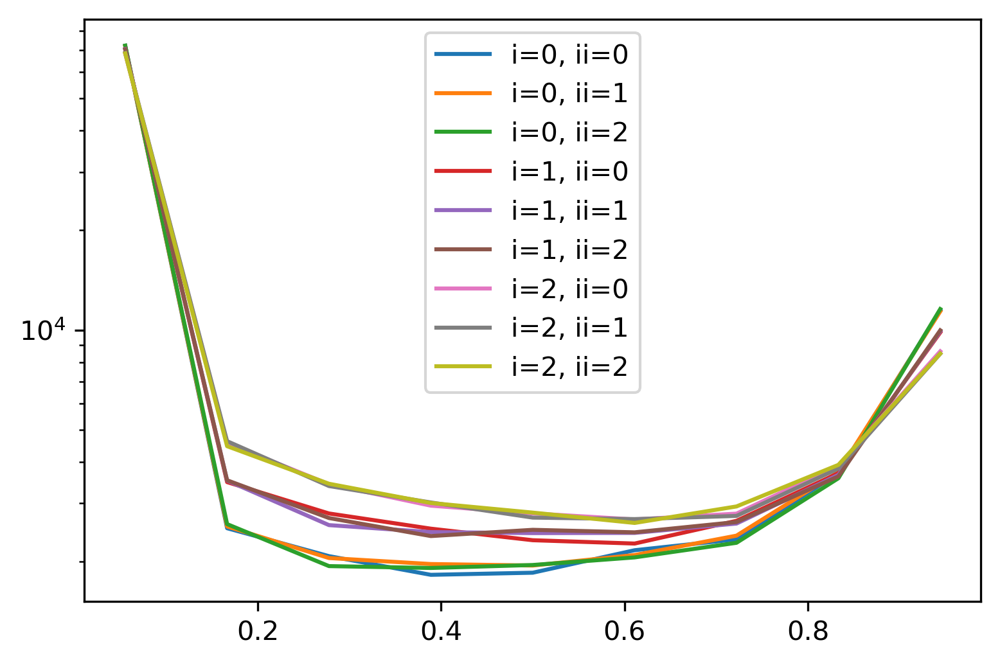

In [13]:
bin_edges = np.linspace(0., 1., 10) # bin_num of bins from 0-1
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

plt.figure(dpi=300)
for i in range(3):
    for ii in range(3):
        plt.semilogy(
            bin_centers, 
            np.histogram(gaussians_Rmax30_11p39_7p67_r3[i, ii], bins=bin_edges)[0],
            label=f'i={i}, ii={ii}'
        )
plt.legend()
plt.show()